In [1]:
import pandas as pd

In [2]:
import geopandas as gpd

In [3]:
import contextily as ctx

In [4]:
import matplotlib.pyplot as plt

In [5]:
import osmnx as ox

In [6]:
import plotly.express as px

In [7]:
gdf = gpd.read_file('Colleges_and_Universities.zip')

In [8]:
gdf.shape

(217, 30)

In [9]:
gdf.head()

,OBJECTID,source,ext_id,cat1,cat2,cat3,org_name,Name,addrln1,addrln2,...,link,use_type,latitude,longitude,date_updat,email,dis_status,POINT_X,POINT_Y,geometry
0,2878,211,None,Education,Colleges and Universities,None,www.csupomona.edu,California State Polytechnic University - Pomona,3801 W. Temple Ave.,None,...,http://egis3.lacounty.gov/lms/?p=3072,publish,34.049531,-117.814466,2013-06-01,None,None,6.617873e+06,1.840458e+06,POINT (-117.81447 34.04953)
1,2895,211,None,Education,Colleges and Universities,None,www.calstate.edu/executive/,"California State University, The - Office Of T...",401 Golden Shore,None,...,http://egis3.lacounty.gov/lms/?p=3084,publish,33.764616,-118.201257,2013-06-01,None,None,6.500498e+06,1.736780e+06,POINT (-118.20126 33.76462)
2,2973,211,None,Education,Colleges and Universities,None,www.calstatela.edu,California State University Los Angeles,5151 State University Dr.,None,...,http://egis3.lacounty.gov/lms/?p=3145,publish,34.062769,-118.170923,2013-06-01,None,None,6.509902e+06,1.845267e+06,POINT (-118.17092 34.06277)
3,3097,211,None,Education,Colleges and Universities,None,www.laccd.edu,Los Angeles Community College District,770 Wilshire Blvd.,None,...,http://egis3.lacounty.gov/lms/?p=3246,publish,34.049138,-118.258111,2013-06-01,None,None,6.483483e+06,1.840363e+06,POINT (-118.25811 34.04914)
4,11961,HSIP Freedom CollegesUniversities,203049,Education,Colleges and Universities,None,LA County,Hebrew Union College-Jewish Institute Of Religion,3077 University Ave,None,...,http://egis3.lacounty.gov/lms/?p=12778,publish,34.025458,-118.282567,2010-11-01,None,None,6.476050e+06,1.831765e+06,POINT (-118.28257 34.02546)


In [10]:
gdf.tail()

,OBJECTID,source,ext_id,cat1,cat2,cat3,org_name,Name,addrln1,addrln2,...,link,use_type,latitude,longitude,date_updat,email,dis_status,POINT_X,POINT_Y,geometry
212,62177,211,None,Education,Colleges and Universities,None,None,Los Angeles Trade Technical College,400 W. Washington Blvd.,None,...,http://egis3.lacounty.gov/lms/?p=68997,publish,34.033227,-118.270041,2013-05-28,None,None,6.479853e+06,1.834582e+06,POINT (-118.27004 34.03323)
213,62310,211,None,Education,Colleges and Universities,None,None,"Help Group, The",13130 Burbank Blvd,None,...,http://egis3.lacounty.gov/lms/?p=70042,publish,34.171910,-118.419360,2015-03-11,None,None,6.434823e+06,1.885206e+06,POINT (-118.41936 34.17191)
214,62928,211,None,Education,Colleges and Universities,None,None,West Los Angeles College,9000 Overland Ave,None,...,http://egis3.lacounty.gov/lms/?p=70461,publish,34.003062,-118.386221,2010-11-01,None,None,6.444611e+06,1.823720e+06,POINT (-118.38622 34.00306)
215,63227,211,None,Education,Colleges and Universities,None,None,Long Beach Community College District,4901 E Carson St,None,...,http://egis3.lacounty.gov/lms/?p=70577,publish,33.834305,-118.135638,2010-11-01,None,None,6.520477e+06,1.762108e+06,POINT (-118.13564 33.83430)
216,63706,211,None,Education,Colleges and Universities,None,None,West Los Angeles College - Community Services ...,9000 Overland Ave,None,...,http://egis3.lacounty.gov/lms/?p=70797,publish,34.003062,-118.386221,2010-11-01,None,None,6.444611e+06,1.823720e+06,POINT (-118.38622 34.00306)


In [11]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 217 entries, 0 to 216
Data columns (total 30 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   OBJECTID    217 non-null    int64   
 1   source      217 non-null    object  
 2   ext_id      189 non-null    object  
 3   cat1        217 non-null    object  
 4   cat2        217 non-null    object  
 5   cat3        0 non-null      object  
 6   org_name    212 non-null    object  
 7   Name        217 non-null    object  
 8   addrln1     215 non-null    object  
 9   addrln2     0 non-null      object  
 10  city        215 non-null    object  
 11  state       217 non-null    object  
 12  hours       15 non-null     object  
 13  phones      215 non-null    object  
 14  url         188 non-null    object  
 15  info1       0 non-null      object  
 16  info2       189 non-null    object  
 17  post_id     217 non-null    int64   
 18  descriptio  28 non-null     object  
 19  

In [12]:
list(gdf)

['OBJECTID',
 'source',
 'ext_id',
 'cat1',
 'cat2',
 'cat3',
 'org_name',
 'Name',
 'addrln1',
 'addrln2',
 'city',
 'state',
 'hours',
 'phones',
 'url',
 'info1',
 'info2',
 'post_id',
 'descriptio',
 'zip',
 'link',
 'use_type',
 'latitude',
 'longitude',
 'date_updat',
 'email',
 'dis_status',
 'POINT_X',
 'POINT_Y',
 'geometry']

In [13]:
columns_to_keep= ['OBJECTID',
 'source',
 'ext_id',
 'cat1',
 'cat2',
 'cat3',
 'org_name',
 'Name',
 'city',
 'state',
 'info1',
 'info2',
 'post_id',
 'zip',
 'latitude',
 'longitude',
 'dis_status',
 'geometry']

In [14]:
gdf= gdf[columns_to_keep]

In [15]:
gdf.head()

,OBJECTID,source,ext_id,cat1,cat2,cat3,org_name,Name,city,state,info1,info2,post_id,zip,latitude,longitude,dis_status,geometry
0,2878,211,None,Education,Colleges and Universities,None,www.csupomona.edu,California State Polytechnic University - Pomona,Pomona,CA,None,None,3072,91768,34.049531,-117.814466,None,POINT (-117.81447 34.04953)
1,2895,211,None,Education,Colleges and Universities,None,www.calstate.edu/executive/,"California State University, The - Office Of T...",Long Beach,CA,None,None,3084,90802,33.764616,-118.201257,None,POINT (-118.20126 33.76462)
2,2973,211,None,Education,Colleges and Universities,None,www.calstatela.edu,California State University Los Angeles,Los Angeles,CA,None,None,3145,90032,34.062769,-118.170923,None,POINT (-118.17092 34.06277)
3,3097,211,None,Education,Colleges and Universities,None,www.laccd.edu,Los Angeles Community College District,Los Angeles,CA,None,None,3246,90017,34.049138,-118.258111,None,POINT (-118.25811 34.04914)
4,11961,HSIP Freedom CollegesUniversities,203049,Education,Colleges and Universities,None,LA County,Hebrew Union College-Jewish Institute Of Religion,Los Angeles,CA,None,99,12778,90007,34.025458,-118.282567,None,POINT (-118.28257 34.02546)


In [16]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 217 entries, 0 to 216
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   OBJECTID    217 non-null    int64   
 1   source      217 non-null    object  
 2   ext_id      189 non-null    object  
 3   cat1        217 non-null    object  
 4   cat2        217 non-null    object  
 5   cat3        0 non-null      object  
 6   org_name    212 non-null    object  
 7   Name        217 non-null    object  
 8   city        215 non-null    object  
 9   state       217 non-null    object  
 10  info1       0 non-null      object  
 11  info2       189 non-null    object  
 12  post_id     217 non-null    int64   
 13  zip         215 non-null    object  
 14  latitude    217 non-null    float64 
 15  longitude   217 non-null    float64 
 16  dis_status  0 non-null      object  
 17  geometry    217 non-null    geometry
dtypes: float64(2), geometry(1), int64(2), obje

In [17]:
gdf['zip'].value_counts()

91711    8
90010    8
90015    6
90028    5
90230    5
        ..
91748    1
91403    1
91745    1
90095    1
90247    1
Name: zip, Length: 126, dtype: int64

In [18]:
#91711 is Clairmont, CA. 90010 is between Koreatown and Sanford (along Wilshire Blvd)

In [19]:
school_count= gdf['Name'].value_counts()

In [20]:
school_count=school_count.reset_index()
school_count

,index,Name
0,Marinello School Of Beauty,8
1,Universal College Of Beauty Inc,3
2,Marinello Schools Of Beauty,3
3,Intercoast Colleges,3
4,West Los Angeles College,2
...,...,...
196,Healthy Hair Academy,1
197,Career College Consultants,1
198,Abram Friedman Occupational Center,1
199,American Film Institute Conservatory,1


In [21]:
school_count.columns.to_list()

['index', 'Name']

In [22]:
school_count.columns=['Name','count']

In [23]:
school_count

,Name,count
0,Marinello School Of Beauty,8
1,Universal College Of Beauty Inc,3
2,Marinello Schools Of Beauty,3
3,Intercoast Colleges,3
4,West Los Angeles College,2
...,...,...
196,Healthy Hair Academy,1
197,Career College Consultants,1
198,Abram Friedman Occupational Center,1
199,American Film Institute Conservatory,1


<AxesSubplot:>

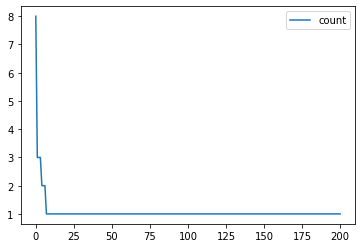

In [24]:
school_count.plot()

In [25]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 217 entries, 0 to 216
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   OBJECTID    217 non-null    int64   
 1   source      217 non-null    object  
 2   ext_id      189 non-null    object  
 3   cat1        217 non-null    object  
 4   cat2        217 non-null    object  
 5   cat3        0 non-null      object  
 6   org_name    212 non-null    object  
 7   Name        217 non-null    object  
 8   city        215 non-null    object  
 9   state       217 non-null    object  
 10  info1       0 non-null      object  
 11  info2       189 non-null    object  
 12  post_id     217 non-null    int64   
 13  zip         215 non-null    object  
 14  latitude    217 non-null    float64 
 15  longitude   217 non-null    float64 
 16  dis_status  0 non-null      object  
 17  geometry    217 non-null    geometry
dtypes: float64(2), geometry(1), int64(2), obje

In [26]:
gdf[['OBJECTID','Name','city','zip','latitude','longitude','geometry']]

,OBJECTID,Name,city,zip,latitude,longitude,geometry
0,2878,California State Polytechnic University - Pomona,Pomona,91768,34.049531,-117.814466,POINT (-117.81447 34.04953)
1,2895,"California State University, The - Office Of T...",Long Beach,90802,33.764616,-118.201257,POINT (-118.20126 33.76462)
2,2973,California State University Los Angeles,Los Angeles,90032,34.062769,-118.170923,POINT (-118.17092 34.06277)
3,3097,Los Angeles Community College District,Los Angeles,90017,34.049138,-118.258111,POINT (-118.25811 34.04914)
4,11961,Hebrew Union College-Jewish Institute Of Religion,Los Angeles,90007,34.025458,-118.282567,POINT (-118.28257 34.02546)
...,...,...,...,...,...,...,...
212,62177,Los Angeles Trade Technical College,Los Angeles,90015,34.033227,-118.270041,POINT (-118.27004 34.03323)
213,62310,"Help Group, The",Sherman Oaks,91401,34.171910,-118.419360,POINT (-118.41936 34.17191)
214,62928,West Los Angeles College,Culver City,90230,34.003062,-118.386221,POINT (-118.38622 34.00306)
215,63227,Long Beach Community College District,Long Beach,90808,33.834305,-118.135638,POINT (-118.13564 33.83430)


In [27]:
desired_columns=['OBJECTID','Name','city','zip','latitude','longitude','geometry']

gdf[desired_columns]

,OBJECTID,Name,city,zip,latitude,longitude,geometry
0,2878,California State Polytechnic University - Pomona,Pomona,91768,34.049531,-117.814466,POINT (-117.81447 34.04953)
1,2895,"California State University, The - Office Of T...",Long Beach,90802,33.764616,-118.201257,POINT (-118.20126 33.76462)
2,2973,California State University Los Angeles,Los Angeles,90032,34.062769,-118.170923,POINT (-118.17092 34.06277)
3,3097,Los Angeles Community College District,Los Angeles,90017,34.049138,-118.258111,POINT (-118.25811 34.04914)
4,11961,Hebrew Union College-Jewish Institute Of Religion,Los Angeles,90007,34.025458,-118.282567,POINT (-118.28257 34.02546)
...,...,...,...,...,...,...,...
212,62177,Los Angeles Trade Technical College,Los Angeles,90015,34.033227,-118.270041,POINT (-118.27004 34.03323)
213,62310,"Help Group, The",Sherman Oaks,91401,34.171910,-118.419360,POINT (-118.41936 34.17191)
214,62928,West Los Angeles College,Culver City,90230,34.003062,-118.386221,POINT (-118.38622 34.00306)
215,63227,Long Beach Community College District,Long Beach,90808,33.834305,-118.135638,POINT (-118.13564 33.83430)


In [28]:
gdf_trimmed=gdf[desired_columns].copy()
gdf_trimmed

,OBJECTID,Name,city,zip,latitude,longitude,geometry
0,2878,California State Polytechnic University - Pomona,Pomona,91768,34.049531,-117.814466,POINT (-117.81447 34.04953)
1,2895,"California State University, The - Office Of T...",Long Beach,90802,33.764616,-118.201257,POINT (-118.20126 33.76462)
2,2973,California State University Los Angeles,Los Angeles,90032,34.062769,-118.170923,POINT (-118.17092 34.06277)
3,3097,Los Angeles Community College District,Los Angeles,90017,34.049138,-118.258111,POINT (-118.25811 34.04914)
4,11961,Hebrew Union College-Jewish Institute Of Religion,Los Angeles,90007,34.025458,-118.282567,POINT (-118.28257 34.02546)
...,...,...,...,...,...,...,...
212,62177,Los Angeles Trade Technical College,Los Angeles,90015,34.033227,-118.270041,POINT (-118.27004 34.03323)
213,62310,"Help Group, The",Sherman Oaks,91401,34.171910,-118.419360,POINT (-118.41936 34.17191)
214,62928,West Los Angeles College,Culver City,90230,34.003062,-118.386221,POINT (-118.38622 34.00306)
215,63227,Long Beach Community College District,Long Beach,90808,33.834305,-118.135638,POINT (-118.13564 33.83430)


<AxesSubplot:>

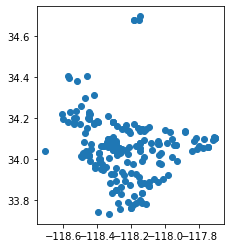

In [29]:
gdf_trimmed.plot()

In [30]:
gdf_trimmed.geometry

0      POINT (-117.81447 34.04953)
1      POINT (-118.20126 33.76462)
2      POINT (-118.17092 34.06277)
3      POINT (-118.25811 34.04914)
4      POINT (-118.28257 34.02546)
                  ...             
212    POINT (-118.27004 34.03323)
213    POINT (-118.41936 34.17191)
214    POINT (-118.38622 34.00306)
215    POINT (-118.13564 33.83430)
216    POINT (-118.38622 34.00306)
Name: geometry, Length: 217, dtype: geometry

<AxesSubplot:>

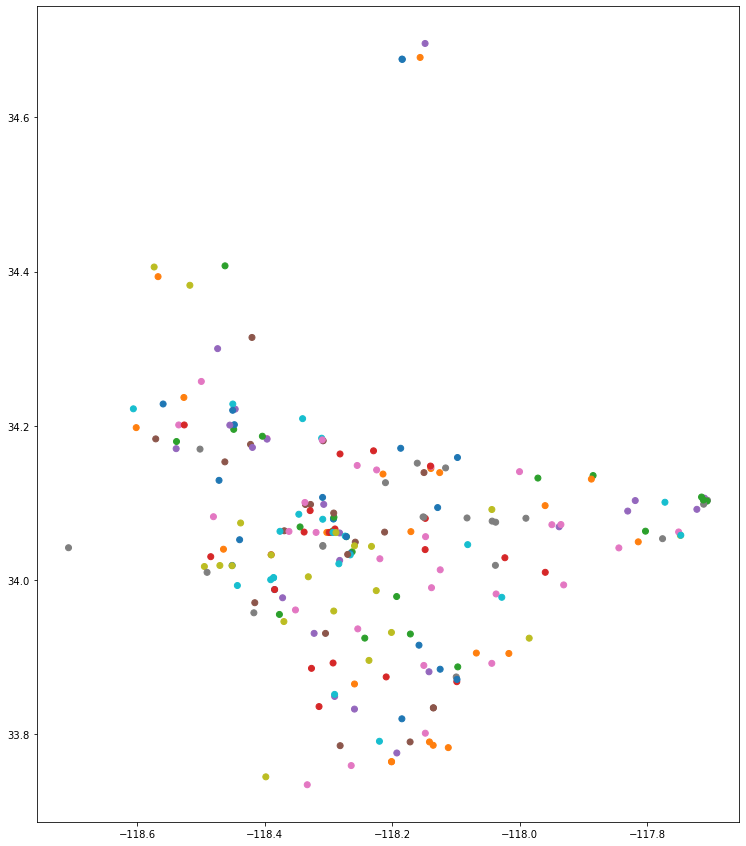

In [31]:
gdf_trimmed.plot(
            figsize=(20,15),  
            column = 'Name',   
            legend = False,              
) 

In [32]:
import folium

In [33]:
m = folium.Map()
m

In [34]:
latitude = gdf_trimmed.latitude.mean()
latitude

34.0581546576037

In [35]:
longitude = gdf_trimmed.longitude.mean()
longitude

-118.22870440806453

In [36]:
m = folium.Map(location= [34.0581546576037, -118.22870440806453])
m

In [37]:
for index, row in gdf_trimmed.iterrows():
    print(row.Name,row.latitude,row.longitude)

California State Polytechnic University - Pomona 34.049531 -117.814466
California State University, The - Office Of The Chancellor 33.764616 -118.201257
California State University Los Angeles 34.062769 -118.170923
Los Angeles Community College District 34.049138 -118.258111
Hebrew Union College-Jewish Institute Of Religion 34.025458 -118.282567
Itt Technical Institute-Sylmar 34.30001 -118.473909
Antioch University-Los Angeles Branch 33.98764 -118.384651
Platt College-Los Angeles 34.081813 -118.151838
Los Angeles Ort Technical Institute 34.063876 -118.369383
Everest College-West Los Angeles 34.032826 -118.389963
Thuy Princess Beauty College 34.057865 -117.748468
North-West College-Glendale 34.148546 -118.255112
Everest College-City Of Industry 34.02892 -118.02357
Fremont College 33.868223 -118.098966
Universal College Of Beauty Inc 34.004239 -118.331741
Itt Technical Institute-Torrance 33.849085 -118.290463
Los Angeles Ort Technical Institute-Sherman Oaks 34.15321 -118.462578
Hacienda 

In [38]:
med = gpd.read_file("MedianIncome.geojson")
med.head()

,geoid,name,Median Household Income,geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",63534.0,"MULTIPOLYGON (((-13169350.794 4063591.834, -13..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",90389.0,"MULTIPOLYGON (((-13169467.902 4065613.937, -13..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",44083.0,"MULTIPOLYGON (((-13169034.646 4063225.625, -13..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",43713.0,"MULTIPOLYGON (((-13167528.939 4062726.771, -13..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",81776.0,"MULTIPOLYGON (((-13166671.668 4062511.964, -13..."


In [39]:
list(med)

['geoid', 'name', 'Median Household Income', 'geometry']

In [40]:
grs= gpd.read_file('GroceryStores.geojson')

In [41]:
list(grs)

['Store_Name',
 'Store_Chain',
 'Street_Number',
 'Street_Name',
 'Additional Address',
 'City',
 'Zip_Code',
 'Latitude',
 'Longitude',
 'geometry']

In [42]:
desired_columns=['Store_Name','Store_Chain','Latitude','Longitude','geometry']

grs[desired_columns]

,Store_Name,Store_Chain,Latitude,Longitude,geometry
0,99 Ranch Market 38,99 Ranch Market,34.09719,-118.1227,POINT (-13149358.815 4041859.746)
1,99 RANCH MARKET 17,99 Ranch Market,33.87005,-118.0824,POINT (-13144872.640 4011366.235)
2,99 Ranch Market 18,99 Ranch Market,33.99284,-117.9318,POINT (-13128107.924 4027840.654)
3,99 RANCH MARKET 7,99 Ranch Market,34.12338,-118.0597,POINT (-13142345.687 4045381.002)
4,99 Ranch Market 3,99 Ranch Market,33.99646,-117.8884,POINT (-13123276.658 4028326.701)
...,...,...,...,...,...
1372,Whole Foods Market 10177,Whole_Foods,34.07133,-118.3603,POINT (-13175808.326 4038383.929)
1373,Whole Foods Market 10536,Whole_Foods,33.97406,-118.4257,POINT (-13183088.621 4025319.450)
1374,Whole Foods Market 10545,Whole_Foods,34.15423,-118.3369,POINT (-13173203.450 4049530.195)
1375,Whole Foods Market 10383,Whole_Foods,34.01985,-118.4973,POINT (-13191059.096 4031467.708)


In [43]:
grs_trimmed=grs[desired_columns]

In [44]:
grs_trimmed.query("Store_Chain == 'Trader_joes'")

,Store_Name,Store_Chain,Latitude,Longitude,geometry
1089,TRADER JOE'S 185,Trader_joes,34.59981,-118.1479,POINT (-13152164.066 4109629.038)
1090,Trader Joe's 205,Trader_joes,33.98038,-118.4406,POINT (-13184747.281 4026167.844)
1091,TRADER JOE'S 116,Trader_joes,33.83224,-118.1851,POINT (-13156305.151 4006298.139)
1092,TRADER JOE'S 44,Trader_joes,34.27231,-118.5021,POINT (-13191593.430 4065425.478)
1093,Trader Joes 13,Trader_joes,34.42815,-118.5366,POINT (-13195433.952 4086438.023)
1094,TRADER JOE'S 56,Trader_joes,34.17224,-118.5177,POINT (-13193330.014 4051953.164)
1095,Trader Joes 237,Trader_joes,34.07169,-118.3772,POINT (-13177689.626 4038432.308)
1096,Trader Joes - Calabasas 254,Trader_joes,34.1554,-118.6444,POINT (-13207434.193 4049687.585)
1097,Trader Joes 247,Trader_joes,34.14571,-118.7551,POINT (-13219757.261 4048384.140)
1098,TRADER JOE'S 13,Trader_joes,34.41937,-118.5443,POINT (-13196291.112 4085253.140)


In [45]:
tj_trimmed=grs_trimmed.query("Store_Chain == 'Trader_joes'")

In [46]:
tj_trimmed.sample(5)

,Store_Name,Store_Chain,Latitude,Longitude,geometry
1116,Trader Joe's 194,Trader_joes,33.7969,-118.1252,POINT (-13149637.114 4001563.152)
1120,TRADER JOE'S 29,Trader_joes,33.79004,-118.3302,POINT (-13172457.609 4000644.250)
1112,TRADER JOE'S 252,Trader_joes,34.18188,-118.3965,POINT (-13179838.092 4053250.291)
1147,TRADER JOE'S 48,Trader_joes,33.94881,-118.0062,POINT (-13136390.094 4021930.529)
1106,TRADER JOE'S 52,Trader_joes,34.23306,-118.2542,POINT (-13163997.328 4060139.386)


In [47]:
grs_trimmed.query("Store_Chain == 'Whole_Foods'")

,Store_Name,Store_Chain,Latitude,Longitude,geometry
1344,Whole Foods Market 10441,Whole_Foods,34.03685,-118.6857,POINT (-13212031.688 4033751.155)
1345,365 by Whole Foods Market 10653,Whole_Foods,34.02202,-118.4662,POINT (-13187597.060 4031759.158)
1346,Whole Foods Market 10108,Whole_Foods,34.15031,-118.072,POINT (-13143714.917 4049002.888)
1347,Whole Foods Market 10701,Whole_Foods,33.75639,-118.1097,POINT (-13147911.662 3996137.873)
1348,Whole Foods Market 10442,Whole_Foods,33.75402,-118.1075,POINT (-13147666.759 3995820.551)
1349,Whole Foods Market 10176,Whole_Foods,34.0617,-118.4477,POINT (-13185537.650 4037089.841)
1350,365 by Whole Foods Market 10658,Whole_Foods,34.10309,-118.2592,POINT (-13164553.926 4042652.908)
1351,Whole Foods Market 10333,Whole_Foods,34.00156,-118.4684,POINT (-13187841.963 4029011.498)
1352,Whole Foods Market 10398,Whole_Foods,34.03263,-118.4947,POINT (-13190769.666 4033184.280)
1353,Whole Foods Market 10022,Whole_Foods,34.06905,-118.3978,POINT (-13179982.807 4038077.527)


In [48]:
wf_trimmed=grs_trimmed.query("Store_Chain == 'Whole_Foods'")
wf_trimmed.sample(5)

,Store_Name,Store_Chain,Latitude,Longitude,geometry
1345,365 by Whole Foods Market 10653,Whole_Foods,34.02202,-118.4662,POINT (-13187597.060 4031759.158)
1355,Whole Food Market Long Beach Lakewood 10688,Whole_Foods,33.82996,-118.1427,POINT (-13151585.205 4005992.597)
1360,Whole Foods Market 10695,Whole_Foods,34.27493,-118.5549,POINT (-13197471.099 4065778.421)
1356,Whole Foods Market 10024,Whole_Foods,33.8472,-118.388,POINT (-13178891.876 4008303.126)
1365,Whole Foods Market 10074,Whole_Foods,34.05341,-118.4674,POINT (-13187730.644 4035975.941)


In [49]:
grs_trimmed.query("Store_Chain == 'Vons'")

,Store_Name,Store_Chain,Latitude,Longitude,geometry
1184,VONS 3519,Vons,33.84164,-118.1847,POINT (-13156260.624 4007557.916)
1185,VONS 2108,Vons,33.85445,-118.381,POINT (-13178112.640 4009274.921)
1186,Vons 3325,Vons,34.42788,-118.5365,POINT (-13195422.820 4086401.584)
1187,VONS 2262,Vons,34.01743,-118.4906,POINT (-13190313.256 4031142.689)
1188,VONS #2173 173,Vons,33.83172,-118.0642,POINT (-13142846.625 4006228.454)
...,...,...,...,...,...
1290,VONS 2213,Vons,34.04863,-118.4618,POINT (-13187107.254 4035333.718)
1291,VONS #2023 23,Vons,34.23349,-118.4391,POINT (-13184580.302 4060197.284)
1292,VONS 1638,Vons,33.83512,-118.1165,POINT (-13148668.634 4006684.099)
1293,VONS 2209,Vons,33.85668,-118.117,POINT (-13148724.294 4009573.848)


In [50]:
vns_trimmed=grs_trimmed.query("Store_Chain == 'Vons'")
vns_trimmed.sample(5)

,Store_Name,Store_Chain,Latitude,Longitude,geometry
1280,VONS 4269,Vons,33.93085,-118.3223,POINT (-13171578.185 4019520.646)
1194,VONS 2155,Vons,34.12159,-117.7062,POINT (-13102994.247 4045140.301)
1188,VONS #2173 173,Vons,33.83172,-118.0642,POINT (-13142846.625 4006228.454)
1270,VONS 2162,Vons,33.72176,-118.3107,POINT (-13170286.879 3991502.101)
1223,VONS 1674,Vons,34.14471,-118.3957,POINT (-13179749.036 4048249.634)


In [51]:
import folium

In [52]:
med=med.rename(index=int,columns={'Median Household Income':'MedianIncome'})

In [53]:
m =folium.Map(location=[34.051850, -118.243322], tiles=None) #Center map on LA County

#Adding basemap
folium.raster_layers.TileLayer(
    location=[34.051850, -118.243322],
    tiles='https://api.mapbox.com/styles/v1/nouraboufadel/ckvb8q3fa8ocm15s2h2chib9k/tiles/256/{z}/{x}/{y}@2x?access_token=pk.eyJ1Ijoibm91cmFib3VmYWRlbCIsImEiOiJja3ZiOGt1cHlha3pyMzBtYXV1b3oxaGN4In0.SSmsYWHC15I9U_ab0deZJA',
    attr='Mapbox',
    API_key='pk.eyJ1Ijoibm91cmFib3VmYWRlbCIsImEiOiJja3ZiOG5yOW0za24xMnVxMTN0b3N0a3lhIn0.LrrhGXdlADB2iXrLAD_C3w',
    name='Monochrome',
    zoom_start=9  # Limited levels of zoom for free Mapbox tiles.
).add_to(m)

#Chloropleth
folium.Choropleth(
    geo_data=med,
    name='Median Household Income',
    data=med,
    popup=med.MedianIncome,
    columns=['geoid', 'MedianIncome'],
    fill_color='YlGn',
    key_on='feature.properties.geoid',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Median Household Income'
).add_to(m)

#second layer to add to map
f2=folium.FeatureGroup(name='Univesities and Colleges').add_to(m)

#markers
for index, row in gdf_trimmed.iterrows():
    folium.Circle([row.latitude, row.longitude], popup=row.Name, tooltip=row.Name, color="purple").add_to(f2)

f3=folium.FeatureGroup(name='Trader Joes Stores').add_to(m)

for index, row in tj_trimmed.iterrows():
    folium.Circle([row.Latitude, row.Longitude], popup=row.Store_Chain, tooltip=row.Store_Chain,color="blue").add_to(f3)

f4=folium.FeatureGroup(name='Whole Foods Stores').add_to(m)

for index, row in wf_trimmed.iterrows():
    folium.Circle([row.Latitude, row.Longitude], popup=row.Store_Chain, tooltip=row.Store_Chain,color="green").add_to(f4)

f5=folium.FeatureGroup(name='Vons Stores').add_to(m)

for index, row in vns_trimmed.iterrows():
    folium.Circle([row.Latitude, row.Longitude], popup=row.Store_Chain, tooltip=row.Store_Chain,color="crimson").add_to(f5)

    
folium.LayerControl(position='topright', collapsed=True, autoZIndex=True).add_to(m)

m.save('schoolsandstores.html')

m

#Author:Nour Abou-Fadel